In [ ]:
# Multi-class dog breed classification

## We build a multi-class image classifier using TensorFlow and TensorFlow Hub

## Problem

Identify the breed of a dog given an image of a dog.

## Data

The data is from Kaggle's Dog Breed Identification competition.

## Evaluation

The evaluation is a file with predicted probabilities for each breed of each test image.

## Features

We are given images of dogs (unstructured data).
There are 120 breeds of dogs to identify.

In [1]:
import tensorflow as tf
print("TF version:", tf.__version__)

TF version: 2.9.2


In [2]:
import tensorflow_hub as Hub
print("TF_hub version:", Hub.__version__)

TF_hub version: 0.12.0


In [3]:
print("GPU", "available (YES!!)" if tf.config.list_physical_devices("GPU") else "not available")

GPU available (YES!!)


## Getting the data ready

In [4]:
import pandas as pd
labels_csv = pd.read_csv("/content/drive/MyDrive/Colab Notebooks/Dog Vision/dog-breed-identification/labels.csv")
print(labels_csv.describe())
labels_csv.head()

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126


,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


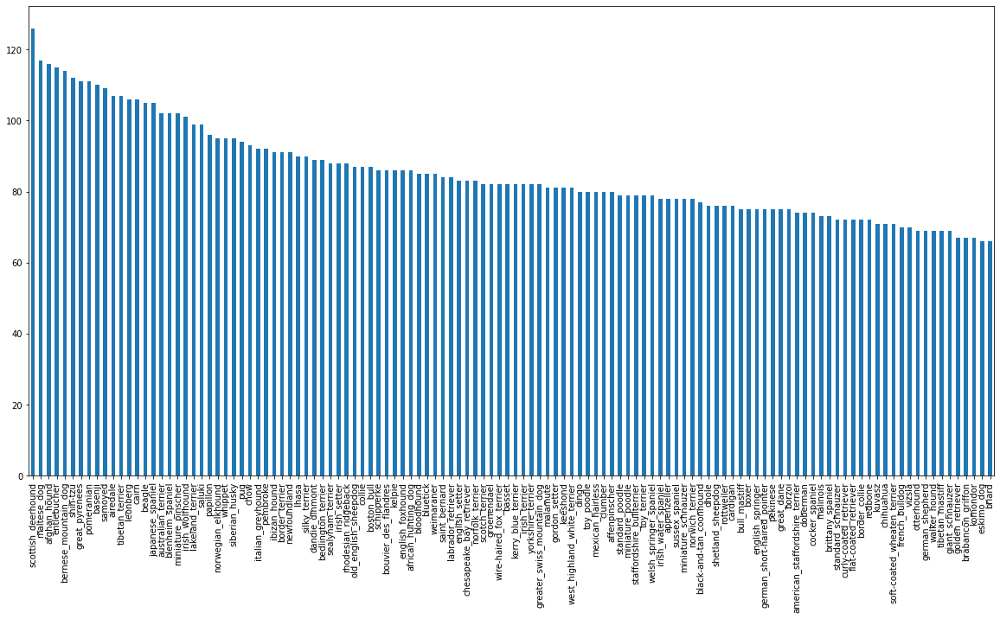

In [ ]:
labels_csv["breed"].value_counts().plot.bar(figsize=(20, 10));

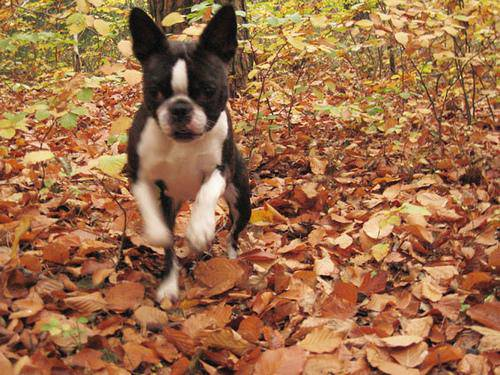

In [ ]:
from IPython.display import Image
Image("/content/drive/MyDrive/Colab Notebooks/Dog Vision/dog-breed-identification/train/000bec180eb18c7604dcecc8fe0dba07.jpg")

In [5]:
# getting images and their labels
filenames = ["/content/drive/MyDrive/Colab Notebooks/Dog Vision/dog-breed-identification/train/" + fname + ".jpg" for fname in labels_csv["id"]]
filenames[:10]

['/content/drive/MyDrive/Colab Notebooks/Dog Vision/dog-breed-identification/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog Vision/dog-breed-identification/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog Vision/dog-breed-identification/train/001cdf01b096e06d78e9e5112d419397.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog Vision/dog-breed-identification/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog Vision/dog-breed-identification/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog Vision/dog-breed-identification/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog Vision/dog-breed-identification/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog Vision/dog-breed-identification/train/002a283a315af96eaea0e28e7163b21b.jpg',
 '/content/drive/MyDrive

In [6]:
# check the number of filenames
import os
if len(os.listdir("/content/drive/MyDrive/Colab Notebooks/Dog Vision/dog-breed-identification/train/")) == len(filenames):
  print("Number of filenames matches the number of files")
else: 
  print("Filenames do not match the number of files. Check the target directory.")

Number of filenames matches the number of files


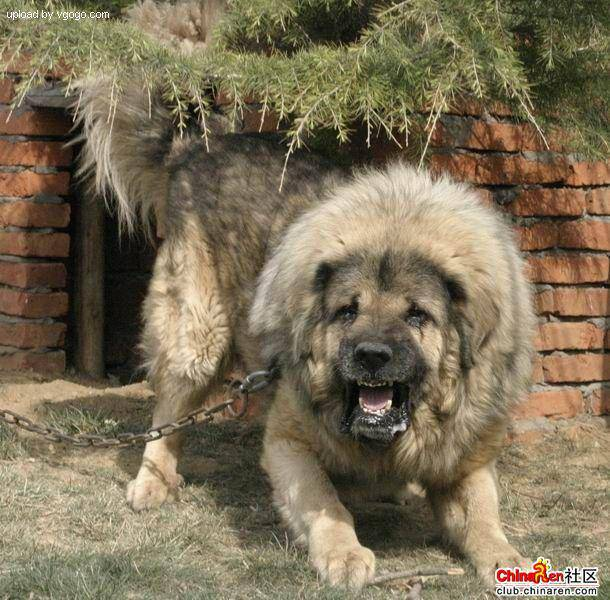

In [ ]:
Image(filenames[9000])

In [7]:
# turning labels into numbers
import numpy as np
labels = labels_csv["breed"]
labels = np.array(labels)
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [ ]:
len(labels)

10222

In [ ]:
if len(labels) == len(filenames):
  print("Number of labels matches the number of filenames.")
else:
  print("Number of labels does not match the number of filenames.")

Number of labels matches the number of filenames.


In [8]:
# find the unique label values
unique_breeds = np.unique(labels)
len(unique_breeds)

120

In [9]:
# turn every label into a boolean array
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
len(boolean_labels)

10222

### Creating a validation set

In [10]:
# Set up X and y sets
X = filenames
y = boolean_labels

In [11]:
# We will start experimenting with about 1000 images and increase as needed.
NUM_IMAGES = 1000 #@param {type:"slider", min:1000, max:10000, step:1000}

In [12]:
from sklearn.model_selection import train_test_split
X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES], y[:NUM_IMAGES], test_size=0.2, random_state=42)

len(X_train), len(y_train), len(X_val), len(y_val)
                                                  

(800, 800, 200, 200)

### Preprocessing images

In [13]:
IMG_SIZE = 224

def process_image(image_path, img_size=IMG_SIZE):
  # read an image file
  image = tf.io.read_file(image_path)
  # turn jpeg into numerical Tensor
  image = tf.image.decode_jpeg(image, channels=3)
  # convert the color channels values from 0-255 to 0-1
  image = tf.image.convert_image_dtype(image, tf.float32)
  # resize the image
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])

  return image


### Dividing data into mini-batches

In [14]:
# a function to return a tuple (image, label)
def get_image_label(image_path, label):
  image = process_image(image_path)
  return image, label

In [15]:
BATCH_SIZE = 32
def create_data_batches(X, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  # if the data is a test dataset
  if test_data:
    print("Creating test data batches ...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X)))
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch
  # if the data is a valid dataset
  elif valid_data:
    print("Creating validation data batches ...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), tf.constant(y)))
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch
  else:
    print("Creating training data batches ...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), tf.constant(y)))
    # shuffle the data
    data = data.shuffle(buffer_size=len(X))
    data = data.map(get_image_label)
    data_batch = data.batch(BATCH_SIZE)
  return data_batch


In [16]:
# create training and validation data batches
train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, valid_data=True)

Creating training data batches ...
Creating validation data batches ...


In [17]:
# check out different attributes of our data
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

### Visualizing data batches

In [18]:
import matplotlib.pyplot as plt
# create a function for viewing the images in a data batch
def show_25_images(images, labels):
  plt.figure(figsize=(10,10))
  for i in range(25):
    ax = plt.subplot(5, 5, i+1)
    plt.imshow(images[i])
    plt.title(unique_breeds[labels[i].argmax()])
    plt.axis("off")

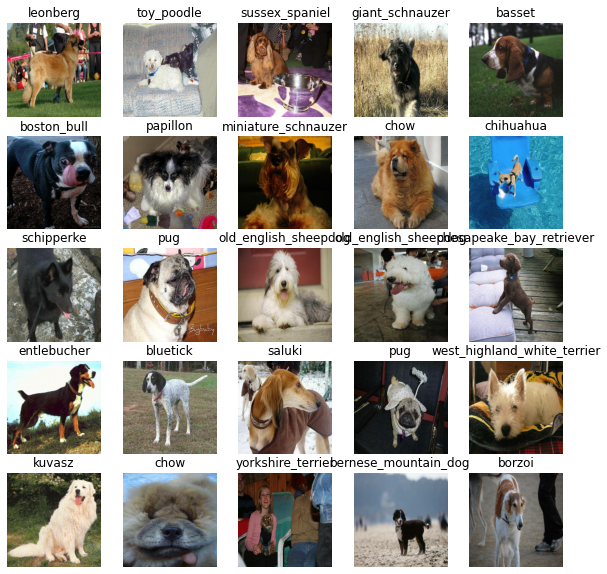

In [19]:
train_images, train_labels = next(train_data.as_numpy_iterator())
show_25_images(train_images, train_labels)

## Building a model

In [20]:
# Set up input shape
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3]

# Set up the output shape
OUTPUT_SHAPE = len(unique_breeds)

# Set up model URL from TensorFlow
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5"

In [21]:
# create a function that builds a Keras model
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print("Building model with:", MODEL_URL)
  # set up model layers
  model = tf.keras.Sequential([
    Hub.KerasLayer(MODEL_URL),
    tf.keras.layers.Dense(units=OUTPUT_SHAPE,
    activation="softmax")
    ])
  # compile the model
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(),
      optimizer=tf.keras.optimizers.Adam(),
      metrics=["accuracy"]
  )
  # build the model
  model.build(INPUT_SHAPE)

  return model

In [22]:
model = create_model()
model.summary()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5,552,953
Trainable params: 120,240
Non-trainable params: 5,432,713
_________________________________________________________________


### Creating callback functions for our model

In [23]:
# TensorBoard callback
%load_ext tensorboard

In [24]:
import datetime
def create_tensorboard_callback():
  logdir = os.path.join("/content/drive/MyDrive/Colab Notebooks/Dog Vision/Logs",
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)

In [25]:
# Early stopping callback to prevent overfitting
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy", patience=3)


## Training our model (on a subset of data)

In [26]:
NUM_EPOCHS = 100 #@param {type:"slider", min:10, max:100, step:10}

In [27]:
# function that trains our model
def train_model():
  model = create_model()
  tensorboard = create_tensorboard_callback()
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard, early_stopping])
  return model

  

In [28]:
# fit the model to the data
model = train_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Epoch 1/100
25/25 [==============================] - 111s 4s/step - loss: 4.7176 - accuracy: 0.0975 - val_loss: 3.4552 - val_accuracy: 0.2500
Epoch 2/100
25/25 [==============================] - 4s 160ms/step - loss: 1.7047 - accuracy: 0.6550 - val_loss: 2.1996 - val_accuracy: 0.4950
Epoch 3/100
25/25 [==============================] - 3s 138ms/step - loss: 0.6035 - accuracy: 0.9162 - val_loss: 1.6750 - val_accuracy: 0.6200
Epoch 4/100
25/25 [==============================] - 4s 156ms/step - loss: 0.2703 - accuracy: 0.9800 - val_loss: 1.4870 - val_accuracy: 0.6400
Epoch 5/100
25/25 [==============================] - 3s 136ms/step - loss: 0.1543 - accuracy: 0.9987 - val_loss: 1.4041 - val_accuracy: 0.6700
Epoch 6/100
25/25 [==============================] - 3s 135ms/step - loss: 0.1052 - accuracy: 0.9975 - val_loss: 1.3602 - val_accuracy: 0.6700
Epoch 7/100
25/25 [==============================]

In [29]:
%tensorboard --logdir /content/drive/My\ Drive/Colab\ Notebooks/Dog\ Vision/Logs

Output hidden; open in https://colab.research.google.com to view.

## Making and evaluating predictions using the trained model

In [30]:
# make prediction on validation data
predictions = model.predict(val_data, verbose=1)
predictions

7/7 [==============================] - 34s 103ms/step


array([[1.66026701e-03, 1.81213755e-03, 6.70649519e-04, ...,
        2.13821739e-04, 1.00102516e-04, 1.52050855e-03],
       [3.47731635e-03, 1.29386329e-03, 3.04836519e-02, ...,
        1.47576589e-04, 2.79396120e-03, 1.86175550e-03],
       [3.34749820e-05, 2.30364603e-05, 2.07093308e-05, ...,
        1.34109519e-04, 3.08132621e-05, 2.49897758e-03],
       ...,
       [1.59292449e-05, 3.66103122e-05, 2.66361079e-04, ...,
        2.30880760e-05, 3.02444998e-04, 1.42205554e-05],
       [4.59441729e-03, 7.74589600e-04, 8.85749978e-05, ...,
        6.43156600e-05, 7.80033297e-05, 3.03078606e-03],
       [1.04748609e-03, 9.14133852e-05, 6.35866832e-04, ...,
        5.46189630e-03, 8.75812431e-04, 2.60937431e-05]], dtype=float32)

In [ ]:
predictions.shape

(200, 120)

In [31]:
# turn prediction probabilities into labels
def get_pred_label(prediction_probabilities):
  return unique_breeds[np.argmax(prediction_probabilities)]

In [32]:
pred_label = get_pred_label(predictions[5])
pred_label

'bedlington_terrier'

In [33]:
val_data

<BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [34]:
# unbatching val_data to make predictions on it
# create a function to unbatch the data
def unbatch(data):
  images = []
  labels = []
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images, labels

# unbatch the validation data
val_images, val_labels = unbatch(val_data)
val_images[0], val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [35]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]
  pred_label = get_pred_label(pred_prob)
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  if pred_label == true_label:
    color = "green"
  else:
    color = "red"

  plt.title("{} {:2.0f}% {}" .format(pred_label, np.max(pred_prob)*100, true_label), color=color)

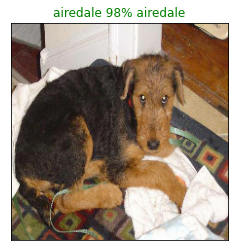

In [ ]:
plot_pred(prediction_probabilities=predictions, labels=val_labels, images=val_images, n=4)

In [36]:
# a function giving top 5 of model's predictions
def plot_pred_conf(prediction_probabilities, labels, n=1):
  pred_prob, true_label = prediction_probabilities[n], labels[n]
  pred_label = get_pred_label(pred_prob)
  top_5_pred_indeces = pred_prob.argsort()[-5:][::-1]
  top_5_pred_values = pred_prob[top_5_pred_indeces]
  top_5_pred_labels = unique_breeds[top_5_pred_indeces]
  top_plot = plt.bar(np.arange(len(top_5_pred_labels)),
                     top_5_pred_values,
                     color="grey")
  plt.xticks(np.arange(len(top_5_pred_labels)),
             labels=top_5_pred_labels,
             rotation="vertical")
  # change the color of the true label
  if np.isin(true_label, top_5_pred_labels):
    top_plot[np.argmax(top_5_pred_labels == true_label)].set_color("green")
  else:
    pass


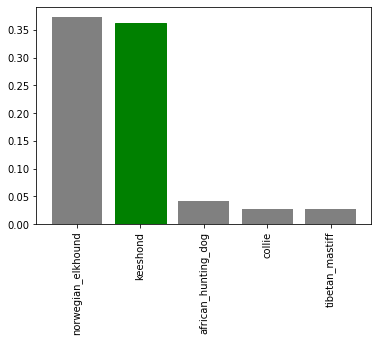

In [ ]:
plot_pred_conf(prediction_probabilities=predictions, labels=val_labels, n=6)

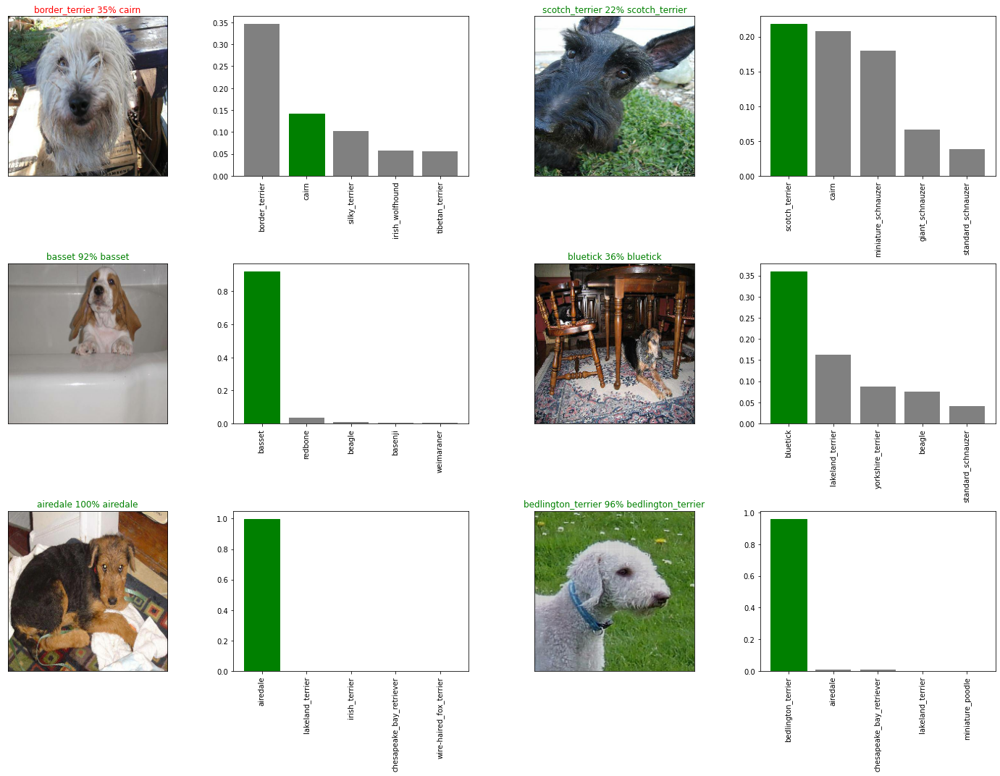

In [37]:
i_multiplier = 0
num_rows = 3
num_cols = 2
num_images = num_rows * num_cols
plt.figure(figsize=(10*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i +1)
  plot_pred(prediction_probabilities=predictions, 
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                  labels=val_labels,
                 n=i+i_multiplier)
  
plt.tight_layout(h_pad=1.0)
plt.show()

## Saving and reloading the model

In [38]:
# create a function to save a model
def save_model(model, suffix=None):
  modeldir = os.path.join("/content/drive/My Drive/Colab Notebooks/Dog Vision/Models",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = modeldir + "-" + suffix + ".h5"
  print(f"Saving model to: {model_path} ...")
  model.save(model_path)
  return model_path

In [39]:
# create a function to load a saved model
def load_model(model_path):
  print(f"Loading saved model from: {model_path}")
  model = tf.keras.models.load_model(model_path,
                                     custom_objects={"KerasLayer": Hub.KerasLayer})
  return model


In [40]:
save_model(model, suffix="1000-images-mobilenetv2-Adam")

Saving model to: /content/drive/My Drive/Colab Notebooks/Dog Vision/Models/20230104-20411672864892-1000-images-mobilenetv2-Adam.h5 ...


'/content/drive/My Drive/Colab Notebooks/Dog Vision/Models/20230104-20411672864892-1000-images-mobilenetv2-Adam.h5'

## Training the model on the full set of data

In [ ]:
len(X), len(y)

(10222, 10222)

In [41]:
# create a data batch with full data set
full_data = create_data_batches(X, y)

Creating training data batches ...


In [42]:
full_data

<BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [43]:
# create a model for the full data set
full_model = create_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5


In [44]:
# create full model callbacks
full_model_tensorboard = create_tensorboard_callback()
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="accuracy", patience=3)

In [45]:
# fit the model to the full data
full_model.fit(x=full_data, 
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard, full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 989s 3s/step - loss: 1.3446 - accuracy: 0.6705
Epoch 2/100
320/320 [==============================] - 41s 128ms/step - loss: 0.3945 - accuracy: 0.8831
Epoch 3/100
320/320 [==============================] - 41s 126ms/step - loss: 0.2355 - accuracy: 0.9361
Epoch 4/100
320/320 [==============================] - 40s 126ms/step - loss: 0.1526 - accuracy: 0.9627
Epoch 5/100
320/320 [==============================] - 40s 125ms/step - loss: 0.1043 - accuracy: 0.9806
Epoch 6/100
320/320 [==============================] - 41s 128ms/step - loss: 0.0752 - accuracy: 0.9865
Epoch 7/100
320/320 [==============================] - 40s 125ms/step - loss: 0.0596 - accuracy: 0.9906
Epoch 8/100
320/320 [==============================] - 42s 130ms/step - loss: 0.0451 - accuracy: 0.9951
Epoch 9/100
320/320 [==============================] - 40s 124ms/step - loss: 0.0366 - accuracy: 0.9958
Epoch 10/100
320/320 [==============================] - 41s 128ms/

In [46]:
save_model(full_model, suffix="full-image-set-mobilenetv2-Adam")

Saving model to: /content/drive/My Drive/Colab Notebooks/Dog Vision/Models/20230104-21241672867447-full-image-set-mobilenetv2-Adam.h5 ...


'/content/drive/My Drive/Colab Notebooks/Dog Vision/Models/20230104-21241672867447-full-image-set-mobilenetv2-Adam.h5'

In [47]:
loaded_full_model = load_model("/content/drive/My Drive/Colab Notebooks/Dog Vision/Models/20230104-21241672867447-full-image-set-mobilenetv2-Adam.h5")

Loading saved model from: /content/drive/My Drive/Colab Notebooks/Dog Vision/Models/20230104-21241672867447-full-image-set-mobilenetv2-Adam.h5


## Making predictions on the test dataset.

In [56]:
# load test image filenames
test_path = "/content/drive/MyDrive/Colab Notebooks/Dog Vision/dog-breed-identification/test/"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['/content/drive/MyDrive/Colab Notebooks/Dog Vision/dog-breed-identification/test/e061b8d24e7b1324a6ac92ae81fdda19.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog Vision/dog-breed-identification/test/e1f9be3ecf0409189486c786ff4bd65a.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog Vision/dog-breed-identification/test/e1cad2c1658b4a81db4750218a1f57d2.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog Vision/dog-breed-identification/test/e22db0abd7c039726b9683fc0a372204.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog Vision/dog-breed-identification/test/e0072c3d9bee718b68ff1cf964a52536.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog Vision/dog-breed-identification/test/e715c53e3d189a20760ef4d891a865dc.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog Vision/dog-breed-identification/test/deb063345bf2b6752e2fe25cad096547.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog Vision/dog-breed-identification/test/e5a89b25873ada7aaafec0de1af86cb1.jpg',
 '/content/drive/MyDrive/Colab N

In [49]:
len(test_filenames)

10363

In [57]:
test_data = create_data_batches(test_filenames, test_data=True)

Creating test data batches ...


In [58]:
test_data

<BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [59]:
# make predictions on test data
test_predictions = loaded_full_model.predict(test_data,
                                             verbose=1)

324/324 [==============================] - 184s 558ms/step


In [62]:
with open('/content/drive/MyDrive/Colab Notebooks/Dog Vision/preds_array.csv', 'w') as f:   
  np.savetxt(f, test_predictions, delimiter=",")

In [63]:
test_predictions = np.loadtxt('/content/drive/MyDrive/Colab Notebooks/Dog Vision/preds_array.csv', delimiter=",")
test_predictions[:2]

array([[1.75554271e-09, 1.39722740e-08, 2.68306941e-08, 1.25405492e-10,
        5.16461929e-10, 2.18443024e-08, 3.00233860e-09, 4.18705213e-07,
        4.17949148e-11, 2.87853140e-07, 7.79447689e-08, 1.40877632e-09,
        6.76473855e-09, 1.03736317e-08, 6.53240591e-07, 3.06738190e-09,
        9.79212475e-11, 3.39709771e-08, 2.91254025e-07, 2.84914421e-07,
        4.34684999e-09, 2.54664756e-09, 1.45839518e-08, 1.79301516e-08,
        2.48301241e-10, 2.78328960e-09, 2.37988829e-09, 1.87609402e-07,
        2.27581491e-08, 1.56334529e-10, 2.84103017e-08, 1.53918851e-08,
        1.94442478e-07, 3.81082582e-10, 4.74011386e-11, 2.76667805e-07,
        8.70098745e-07, 4.60686863e-07, 8.13076554e-07, 1.58868607e-09,
        4.59297947e-11, 6.68911637e-09, 2.05847570e-08, 4.89461683e-02,
        5.58785136e-11, 3.85655767e-07, 2.27997404e-07, 1.55136048e-09,
        2.83337265e-08, 7.42032169e-09, 2.41395330e-08, 4.38677705e-10,
        3.03868553e-09, 2.19872916e-07, 4.64703866e-08, 1.148986

In [64]:
test_predictions.shape

(10363, 120)

In [66]:
preds_df = pd.DataFrame(columns=["id"] + list(unique_breeds))
test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
preds_df["id"] = test_ids
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e061b8d24e7b1324a6ac92ae81fdda19,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,e1f9be3ecf0409189486c786ff4bd65a,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,e1cad2c1658b4a81db4750218a1f57d2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,e22db0abd7c039726b9683fc0a372204,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,e0072c3d9bee718b68ff1cf964a52536,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [67]:
preds_df[list(unique_breeds)] = test_predictions
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e061b8d24e7b1324a6ac92ae81fdda19,1.755543e-09,1.397227e-08,2.683069e-08,1.254055e-10,5.164619e-10,2.184430e-08,3.002339e-09,4.187052e-07,4.179491e-11,...,1.107946e-09,1.377340e-08,7.518258e-11,3.667005e-09,3.731201e-09,4.626410e-10,2.943387e-09,5.617841e-10,2.368482e-08,2.838152e-09
1,e1f9be3ecf0409189486c786ff4bd65a,2.165824e-08,1.136981e-12,2.396525e-09,2.041666e-13,1.821607e-11,4.412066e-08,2.302647e-08,2.760960e-07,1.317152e-10,...,1.004567e-05,4.466436e-05,2.513093e-10,5.426561e-12,1.279519e-10,4.494324e-09,7.762234e-10,3.876722e-09,5.756913e-11,2.024540e-07
2,e1cad2c1658b4a81db4750218a1f57d2,1.817686e-14,1.545514e-12,9.352089e-09,7.519826e-11,2.580073e-06,1.763864e-09,1.940164e-07,9.978708e-01,1.468405e-08,...,5.859603e-09,1.878596e-08,1.582725e-10,9.077470e-09,8.252076e-08,1.086520e-06,8.926498e-09,4.437487e-06,6.561231e-05,3.421575e-09
3,e22db0abd7c039726b9683fc0a372204,3.066004e-11,3.022926e-10,9.131718e-08,2.913746e-11,1.667957e-10,5.951724e-10,2.774918e-10,1.201182e-11,2.202646e-12,...,1.145108e-11,7.650251e-12,1.570466e-11,5.393058e-11,1.780507e-09,1.205974e-13,1.782219e-10,1.791188e-10,2.309124e-12,3.416688e-13
4,e0072c3d9bee718b68ff1cf964a52536,2.126509e-10,6.333650e-09,1.466229e-10,1.188109e-10,1.378544e-09,2.031505e-08,3.010952e-10,1.282606e-09,4.589780e-04,...,6.815312e-10,3.702629e-05,3.412850e-05,3.015826e-03,6.794279e-08,1.637176e-10,1.454544e-10,7.863387e-06,2.527510e-09,5.260529e-11


In [70]:
with open('/content/drive/MyDrive/Colab Notebooks/Dog Vision/full_model_predictions_submission_1.csv', 'w') as f: 
  preds_df.to_csv(f, index=False)

## Making predictions on custom images